In [1]:
from sklearn.manifold import Isomap, LocallyLinearEmbedding, MDS, SpectralEmbedding, TSNE
from sklearn.decomposition import PCA
import umap.umap_ as umap
import numpy as np
import wandb
from sklearn.preprocessing import LabelEncoder
from io import BytesIO
import base64
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.io import output_notebook
from bokeh.resources import INLINE
import colorcet as cc
import pandas as pd
from gorillatracker.datasets.cxl import CXLDataset
from gorillatracker.model import EfficientNetV2Wrapper
from gorillatracker.transform_utils import SquarePad
import torch
import torchvision.transforms as transforms

output_notebook(INLINE)


class EmbeddingProjector:
    def __init__(self):
        self.algorithms = {
            "tsne": TSNE(n_components=2),
            "isomap": Isomap(n_components=2),
            "lle": LocallyLinearEmbedding(n_components=2),
            "mds": MDS(n_components=2),
            "spectral": SpectralEmbedding(n_components=2),
            "pca": PCA(n_components=2),
            "umap": umap.UMAP(),
        }

    def reduce_dimensions(self, embeddings, method="tsne"):
        # handle --fast_dev_run where there is a reduced number of embeddings
        assert len(embeddings) > 2
        algorithm = TSNE(n_components=2, perplexity=1)
        if len(embeddings) > 30:
            algorithm = self.algorithms.get(method, TSNE(n_components=2))
        return algorithm.fit_transform(embeddings)

    def plot_clusters(
        self, low_dim_embeddings, labels, og_labels, images, title="Embedding Projector", figsize=(12, 10)
    ):
        color_names = cc.glasbey
        color_lst = [color_names[label * 2] for label in labels]
        data = {
            "x": low_dim_embeddings[:, 0],
            "y": low_dim_embeddings[:, 1],
            "color": color_lst,
            "class": og_labels,
            "image": images,
        }

        fig = figure(tools="pan, wheel_zoom, box_zoom, reset")
        fig.scatter(
            x="x",
            y="y",
            size=12,
            fill_color="color",
            line_color="black",
            source=ColumnDataSource(data=data),
            legend_field="class",
        )

        hover = HoverTool(tooltips='<img src="data:image/jpeg;base64,@image" width="128" height="128">')
        fig.add_tools(hover)

        output_notebook()
        show(fig)

/tmp/ipykernel_111791/1821441933.py:14: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was too old on your system - pyarrow 10.0.1 is the current minimum supported version as of this release.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Loading BokehJS ...

### Generate Embeddings

In [2]:
wandb.login()
wandb.init(mode="disabled")
api = wandb.Api()

# # if directly loading from wandb is wished:
# artifact = api.artifact(
#     "gorillas/Embedding-SwinV2-CXL-Open/run_121-visualize-embeddings-2024-01-16-11-14-53_epoch_0:v0",
#     type="embeddings",
# )
# artifact_dir = artifact.download()
# table = artifact.get("embeddings_table_epoch_0")

# df = table.get_dataframe()
# embeddings = df["embedding"].to_numpy()
# embeddings = np.stack(embeddings)

# if loading from model that is saved on wandb is wished:
artifact = api.artifact(
    "gorillas/Embedding-ALL-SPAC-Open/model-3ag1c2vf:v1",
    type="model",
)
artifact_dir = artifact.download()
model = artifact_dir + "/model.ckpt"

# load model
checkpoint = torch.load(model, map_location=torch.device("cpu"))

model = EfficientNetV2Wrapper(
    model_name_or_path="EfficientNetV2_Large",
    from_scratch=False,
    loss_mode="softmax/arcface",
    weight_decay=0.001,
    lr_schedule="cosine",
    warmup_mode="cosine",
    warmup_epochs=10,
    max_epochs=100,
    initial_lr=0.01,
    start_lr=0.01,
    end_lr=0.0001,
    beta1=0.9,
    beta2=0.999,
    embedding_size=128,
)
model.loss_module_train.prototypes = torch.nn.Parameter(checkpoint["state_dict"]["loss_module_train.prototypes"])
model.loss_module_val.prototypes = torch.nn.Parameter(checkpoint["state_dict"]["loss_module_val.prototypes"])

model.load_state_dict(checkpoint["state_dict"])
model.eval()

# generate table that contains labels and images and embeddings
df = pd.DataFrame(columns=["label", "image", "embedding"])
dataset = CXLDataset(
    data_dir="/workspaces/gorillatracker/data/splits/ground_truth-cxl-face_images-openset-reid-val-0-test-0-mintraincount-3-seed-42-train-50-val-25-test-25",
    partition="val",
    transform=transforms.Compose(
        [
            SquarePad(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
        ]
    ),
)

for i in range(len(dataset)):
    image_tensor, label = dataset[i]
    label_string = dataset.mapping[label]
    embedding = model(image_tensor.unsqueeze(0))  # TODO: check if this is the correct way to get the embedding
    image = transforms.ToPILImage()(image_tensor)
    image_tensor = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.228, 0.224, 0.225])(image_tensor)
    df = pd.concat(
        [
            df,
            pd.DataFrame(
                {
                    "label_string": [label_string],
                    "label": [label],
                    "image": [image],
                    "embedding": [embedding[0].detach().numpy()],
                }
            ),
        ]
    )

    if i % 10 == 0:
        print(f"\rprocessed {i} images")
df = df.reset_index(drop=False)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: robert-weeke (gorillas). Use `wandb login --relogin` to force relogin
wandb: Downloading large artifact model-3ag1c2vf:v1, 1346.85MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:4.2
/workspaces/gorillatracker/src/gorillatracker/losses/arcface_loss.py:27: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at /opt/conda/conda-bld/pytorch_1702400366987/work/torch/csrc/tensor/python_tensor.cpp:83.)
  self.prototypes = torch.nn.Parameter(torch.cuda.FloatTensor(num_classes, embedding_size))  # type: ignore


processed 0 images
processed 10 images
processed 20 images
processed 30 images
processed 40 images
processed 50 images
processed 60 images
processed 70 images
processed 80 images
processed 90 images
processed 100 images
processed 110 images
processed 120 images


In [3]:
labels = df["label"].to_numpy()
embeddings = df["embedding"].to_numpy()
embeddings = np.stack(embeddings)

pil_images = df["image"]
images = []
for image in pil_images:
    buffer = BytesIO()
    image.save(buffer, format="JPEG")
    image_byte = base64.b64encode(buffer.getvalue()).decode("utf-8")
    images.append(image_byte)

ep = EmbeddingProjector()
low_dim_embeddings = ep.reduce_dimensions(embeddings, method="umap")
ep.plot_clusters(low_dim_embeddings, labels, df["label_string"], images, title="Embedding Projector", figsize=(12, 10))

Loading BokehJS ...

### Maybe a better overview of the data when len(individual) > 3

In [4]:
# filter out classes that have less than 3 images
df_filtered = df.groupby("label").filter(lambda x: len(x) > 3)

labels = df_filtered["label"].to_numpy()
embeddings = df_filtered["embedding"].to_numpy()
embeddings = np.stack(embeddings)

pil_images = df_filtered["image"]
images = []
for image in pil_images:
    buffer = BytesIO()
    image.save(buffer, format="JPEG")
    image_byte = base64.b64encode(buffer.getvalue()).decode("utf-8")
    images.append(image_byte)

ep = EmbeddingProjector()
low_dim_embeddings = ep.reduce_dimensions(embeddings, method="tsne")
ep.plot_clusters(
    low_dim_embeddings, labels, df_filtered["label_string"], images, title="Embedding Projector", figsize=(12, 10)
)

Loading BokehJS ...

In [6]:
print(df.head())

   index label                                              image  \
0      0     2  <PIL.Image.Image image mode=RGB size=224x224 a...   
1      0    15  <PIL.Image.Image image mode=RGB size=224x224 a...   
2      0     9  <PIL.Image.Image image mode=RGB size=224x224 a...   
3      0    26  <PIL.Image.Image image mode=RGB size=224x224 a...   
4      0    21  <PIL.Image.Image image mode=RGB size=224x224 a...   

                                           embedding label_string  
0  [0.18389775, -0.06994343, 0.6327752, 0.2004048...         HU40  
1  [-0.2115694, 0.42428127, 0.9292161, -0.4406900...         TU03  
2  [0.43735576, 0.43260166, 0.90547544, -0.155698...         PL00  
3  [0.081012554, 0.59991586, 0.49982733, -0.24651...         YE40  
4  [0.39666483, 0.10781666, 0.3886284, -0.0499320...         US01  


### Now add Grad-CAM

In [16]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputSoftmaxTarget
import PIL


def get_grad_cam_layer():
    return model.model.features[-1][-1]


def log_grad_cam_images_to_wandb(model, samples) -> None:  # TODO
    # NOTE(liamvdv): inverse grad cam support to model since we might not be using
    #                a model which grad cam does not support.
    # NOTE(liamvdv): Transform models may have different interpretations.
    # print(samples)
    assert model is not None, "Must only call log_grad_cam_images... after model was initialized."

    target_layer = get_grad_cam_layer()
    get_reshape_transform = getattr(model, "get_grad_cam_reshape_transform", lambda: None)
    cam = GradCAM(model=model, target_layers=[target_layer], reshape_transform=get_reshape_transform())

    images = []
    for sample in samples:
        # a row (nlet) can either be (ap, p, n) OR (ap, p, n, an)
        img, label = sample
        grayscale_cam = cam(input_tensor=img.unsqueeze(0), targets=label, aug_smooth=True, eigen_smooth=True)

        # Overlay heatmap on original image
        heatmap = grayscale_cam[0, :]
        image = np.array(transforms.ToPILImage()(img)).astype(np.float32) / 255.0  # NOTE(liamvdv): needs be normalized
        image_with_heatmap = show_cam_on_image(image, heatmap, use_rgb=True)
        images.append(PIL.Image.fromarray(image_with_heatmap))
    return images


class ClassifierHead(torch.nn.Module):
    def __init__(self, weights) -> None:
        super().__init__()
        self.weights = weights

    def forward(self, x):
        if x.shape[1] == 128:
            x = x @ self.weights.T
            x = torch.nn.functional.normalize(x, dim=1, p=2)
        return x


# build Linear layer from loss_module prototypes
weights = model.loss_module_val.prototypes
weights = weights / torch.norm(weights, dim=1, keepdim=True)
weights = torch.nn.Parameter(weights)
# linear_layer = ClassifierHead(weights)
linear_layer = ClassifierHead(weights_trained)

# init linear layer
test = torch.randn(1, 128)
test = linear_layer(test)

model.model.classifier = torch.nn.Sequential(
    model.model.classifier,
    linear_layer,
)

imgs = []
for index in range(20):
    sample_imgs = transforms.ToTensor()(df["image"][index])
    sample_labels = torch.tensor([df["label"][index]])

    # one hot encode labels
    sample_labels = [ClassifierOutputSoftmaxTarget(sample_labels[0])]

    samples = [(sample_imgs, sample_labels)]
    imgs.append(log_grad_cam_images_to_wandb(model, samples))

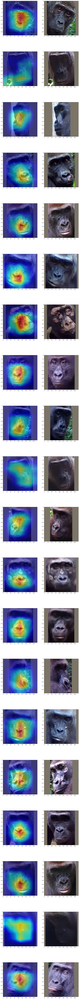

In [18]:
# convert to pil images and show with matplotlib
import matplotlib.pyplot as plt

fig, axs = plt.subplots(20, 2, figsize=(15, 200))

imgs = [img for sublist in imgs for img in sublist]

for index in range(20):
    axs[index, 0].imshow(imgs[index])
    axs[index, 1].imshow(df["image"][index])

plt.show()

In [15]:
import torchmetrics as tm
import sklearn


def fc_layer2(
    embeddings: torch.Tensor,
    labels,
    loss_module_val: torch.nn.Module,
    s=64.0,
    **kwargs,
):
    # num_classes = (
    #     int(np.max(labels)) + 1
    # )
    num_classes = 29
    seed = 42
    batch_size = 32

    embeddings = torch.tensor(embeddings)
    labels = torch.tensor(labels)

    # weights = loss_module_val.prototypes.clone().detach()  # shape (num_classes, embedding_size)
    # calculate weights by averaging embeddings of each class
    weights = torch.zeros((num_classes, 128))
    for i in range(num_classes):
        weights[i] = torch.mean(embeddings[labels == i], dim=0)
        # normalize weights

    weights = torch.nn.Parameter(weights)
    weights.requires_grad_(True)

    optimizer = torch.optim.SGD(params=[weights], lr=0.1, weight_decay=0.001)
    criterion = torch.nn.CrossEntropyLoss()
    epochs = 1000
    # acitvate gradients
    with torch.set_grad_enabled(True):
        for epoch in range(epochs):
            loss_sum = 0.0
            embeddings_copy, labels_copy = sklearn.utils.shuffle(
                embeddings, labels, random_state=seed + epoch, n_samples=len(embeddings)
            )

            for i in range(0, len(embeddings_copy), batch_size):
                batch_embeddings = torch.tensor(embeddings_copy[i : i + batch_size])
                batch_labels = torch.tensor(labels_copy[i : i + batch_size], dtype=torch.long)

                assert batch_embeddings.shape[0] == batch_labels.shape[0]
                phi = torch.nn.functional.linear(batch_embeddings, weights)
                phi = torch.nn.functional.normalize(phi, dim=1)

                outputs = phi * s

                assert outputs.shape[0] == batch_embeddings.shape[0]
                loss = criterion(outputs, batch_labels)

                optimizer.zero_grad()
                loss.requires_grad_(True)
                loss.backward()
                # apply gradient clipping
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)  # type: ignore
                optimizer.step()
                loss_sum += loss.item()

            loss_mean = loss_sum / (len(embeddings_copy) / batch_size)
            loss_sum = 0.0
            if epoch % 100 == 0:
                print(f"Loss: {loss_mean} in Epoch {epoch}")

    output = torch.nn.functional.linear(embeddings, weights)
    output = torch.nn.functional.normalize(output, dim=1)
    final_output = torch.nn.functional.softmax(output, dim=1)
    print(torch.max(final_output, dim=1)[1])
    print(labels)

    accuracy = tm.functional.accuracy(
        final_output, labels, task="multiclass", num_classes=num_classes, average="weighted"
    )
    assert accuracy is not None
    accuracy_top5 = tm.functional.accuracy(final_output, labels, task="multiclass", num_classes=num_classes, top_k=5)
    assert accuracy_top5 is not None
    auroc = tm.functional.auroc(final_output, labels, task="multiclass", num_classes=num_classes)
    assert auroc is not None
    f1 = tm.functional.f1_score(final_output, labels, task="multiclass", num_classes=num_classes, average="weighted")
    assert f1 is not None
    return {
        "accuracy": accuracy.item(),
        "accuracy_top5": accuracy_top5.item(),
        "auroc": auroc.item(),
        "f1": f1.item(),
    }, weights


labels = df["label"].to_numpy().astype(int)


results, weights_trained = fc_layer2(embeddings, labels, model.loss_module_val)
print(results)

/tmp/ipykernel_111791/4132715773.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  batch_embeddings = torch.tensor(embeddings_copy[i : i + batch_size])
/tmp/ipykernel_111791/4132715773.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  batch_labels = torch.tensor(labels_copy[i : i + batch_size], dtype=torch.long)


Loss: 2.3765370202442955 in Epoch 0
Loss: 1.784789070250496 in Epoch 100
Loss: 1.553676998804486 in Epoch 200
Loss: 1.3263893732948908 in Epoch 300
Loss: 1.1174667600601438 in Epoch 400
Loss: 0.9182364145914713 in Epoch 500
Loss: 0.7290238577222067 in Epoch 600
Loss: 0.5632939490060958 in Epoch 700
Loss: 0.4185385476975214 in Epoch 800
Loss: 0.29645175404018825 in Epoch 900
tensor([ 2, 15,  9, 26, 21,  0,  7, 23,  9, 15,  8, 12, 14, 20,  0, 22, 10, 21,
        18,  3, 23, 13,  1, 21, 14, 21,  7, 25, 10, 21, 12, 21, 15, 16, 26,  0,
         9, 11, 21,  7, 17, 16,  8,  5, 16, 16, 11, 24,  8,  4, 23, 14, 22, 27,
        23, 20,  6,  8,  7,  4,  7, 20, 21, 19, 18,  1,  2,  5, 10, 20,  1, 27,
        11, 18,  1, 21,  4, 14, 17, 14,  4, 24, 21, 20,  0, 22, 13, 26, 21,  2,
        14,  8, 19, 12, 15, 14, 19,  3, 23,  7, 20, 10, 17, 22,  6, 26, 27, 19,
         7, 28,  5, 11, 20,  1, 20, 13,  4,  8, 23,  3, 28, 14, 21,  5, 13,  1])
tensor([ 2, 15,  9, 26, 21,  0,  7, 23,  9, 15,  8, 12, 14, 20